# <div style="text-align: center"> <font size=+5> <ins>ANALYSE DATA</ins> </font> </div>
___

# Imports and settings

In [14]:
#imports
import numpy as np
import pandas as pd

import os

import warnings

import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

In [15]:
#settings
plt.rcParams.update({'figure.figsize': [6.0, 4.0],
                     'figure.dpi' : 300,
                     'font.size': 12.0, 
                     'mathtext.fontset' : 'stix', 
                     'font.family' : 'STIXGeneral'
                    })

pd.set_option('display.max_columns', 500)

___
# Questionnaires general info

In [138]:
data = pd.read_pickle("../Processed_Data/questionnaires/issp_questionnaires_common.pickle")
summary = pd.DataFrame(index = [1993, 2000, 2010, 2020, "Total"], columns=["Partecipating Countries", "Respondents (country average)", "Respondents (total)"])
for year in summary.index[:-1]:
    summary.loc[year, "Partecipating Countries"] = data.loc[year].index.get_level_values("Country").unique().shape[0]
    summary.loc[year, "Respondents (country average)"] = data.loc[year].groupby("Country").count()[("Respondent Data", "Weight")].mean().astype("int")
    summary.loc[year, "Respondents (total)"] = data.loc[year].count()[("Respondent Data", "Weight")]
summary.loc["Total", "Partecipating Countries"] = data.index.get_level_values("Country").unique().shape[0]
summary.loc["Total", "Respondents (country average)"] = data.groupby(["Year","Country"]).count()[("Respondent Data", "Weight")].mean().astype("int")
summary.loc["Total", "Respondents (total)"] = data.count()[("Respondent Data", "Weight")]

summary

,Partecipating Countries,Respondents (country average),Respondents (total)
1993,20,1415,28301
2000,25,1241,31042
2010,36,1401,50437
2020,27,1633,44100
Total,42,1424,153880


In [139]:
data = pd.read_pickle("../Processed_Data/questionnaires/issp_questionnaires_common.pickle")
partecip = {i:0 for i in range(1,5)}
countries = pd.Series(index=data.index.get_level_values("Country").unique(), dtype="int32")
for country in countries.index:
    n_years_country = data.loc[(slice(None), country,slice(None)),:].index.get_level_values("Year").unique().shape[0]
    partecip[n_years_country] += 1
    countries[country] = n_years_country
print("Countries that took part in:")
for key, val in partecip.items():
    year = "year" if key==1 else "years"
    print(f"{key} {year}: {val}")

Countries that took part in:
1 year: 6
2 years: 15
3 years: 12
4 years: 9


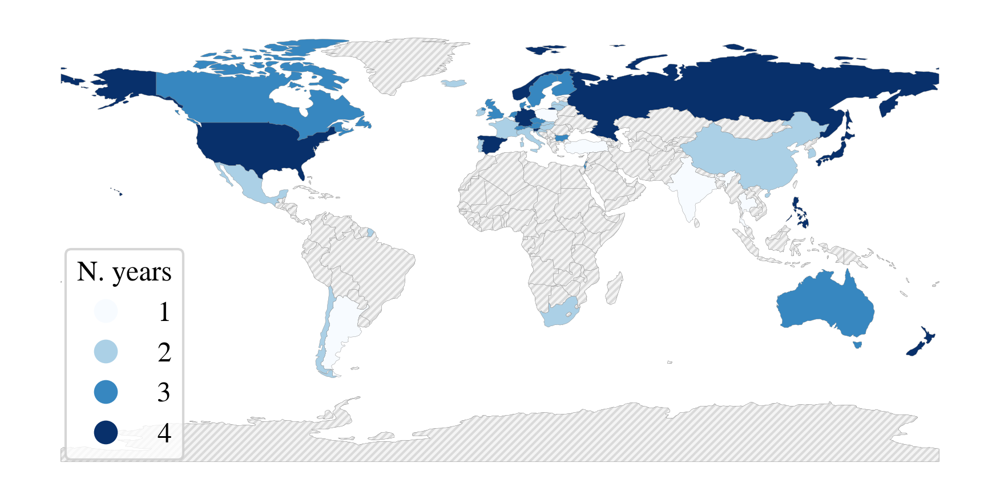

In [140]:
import geopandas as gpd
worldmap = gpd.GeoDataFrame(pd.read_pickle("../Processed_Data/misc/worldmap.pickle"))
worldmap.index.name = "Country"
c_names = {
    "United States of America" : "United States",
    "South Korea" : "South Korea",
    "Turkey" : "Turkiye",
}
worldmap.index = worldmap.index.map(lambda c: c if c not in c_names else c_names[c])
worldmap["Number of partecipation years"] = countries.astype("int").astype("category")


fig, ax = plt.subplots()

partecipating = ~worldmap["Number of partecipation years"].isna()

df = worldmap.loc[partecipating,:]
df.loc[:,"Number of partecipation years"] = df["Number of partecipation years"]
df.plot(column="Number of partecipation years", cmap="Blues", edgecolor="grey", linewidth=0.1, ax=ax, legend=True)

worldmap.loc[~partecipating,:].plot(color=[1,1,1], edgecolor="gray", linewidth=0.1, hatch="////////", ax=ax)
worldmap.loc[~partecipating,:].plot(edgecolor="gray", linewidth=0.1, color=[0.95,0.95,0.95], alpha=0.8, ax=ax)

ax.get_legend().set_loc((0.05,0.05))
ax.get_legend().set_title("N. years")
ax.get_legend().handletextpad = 0

plt.axis("off");
plt.tight_layout()

#plt.savefig("../Figures/countries_issp.pdf", format="pdf")

___
# Clusters of questions

- Some questions may be grouped into single "topic" -> which ones?

#### Topics:
1. Awareness (Danger to environment (...))
2. Will to act (Willingness to make trade-offs (...), Sort glass, Member of group, Signed petition, Participated in demonstration, Given Money, I do what is right)
3. Efficacy of environmental action (We worry too much..., Too difficult to do much..., Science solves environmental problems)

In [6]:
from matplotlib.patches import PathPatch, Path
import numpy as np

def CurlyBrace(x, y, width=1/8, height=1., curliness=1/np.e, pointing='left', **patch_kw):
    '''Create a matplotlib patch corresponding to a curly brace (i.e. this thing: "{")

    Parameters
    ----------
    x : float
        x position of left edge of patch
    y : float
        y position of bottom edge of patch
    width : float
        horizontal span of patch
    height : float
        vertical span of patch
    curliness : float
        positive value indicating extent of curliness; default (1/e) tends to look nice
    pointing : str
        direction in which the curly brace points (currently supports 'left' and 'right')
    **patch_kw : any keyword args accepted by matplotlib's Patch

    Returns
    -------
    matplotlib PathPatch corresponding to curly brace
    
    Notes
    -----
    It is useful to supply the `transform` parameter to specify the coordinate system for the Patch.

    To add to Axes `ax`:
    cb = CurlyBrace(x, y)
    ax.add_artist(cb)

    This has been written as a function that returns a Patch because I saw no use in making it a class, though one could extend matplotlib's Patch as an alternate implementation.
    
    Thanks to:
    https://graphicdesign.stackexchange.com/questions/86334/inkscape-easy-way-to-create-curly-brace-bracket
    http://www.inkscapeforum.com/viewtopic.php?t=11228
    https://css-tricks.com/svg-path-syntax-illustrated-guide/
    https://matplotlib.org/users/path_tutorial.html

    Ben Deverett, 2018.


    Examples
    --------
    >>>from curly_brace_patch import CurlyBrace
    >>>import matplotlib.pyplot as pl
    >>>fig,ax = pl.subplots()
    >>>brace = CurlyBrace(x=.4, y=.2, width=.2, height=.6, pointing='right', transform=ax.transAxes, color='magenta')
    >>>ax.add_artist(brace)

    '''

    verts = np.array([
           [width,0],
           [0,0],
           [width, curliness],
           [0,.5],
           [width, 1-curliness],
           [0,1],
           [width,1]
           ])
    
    if pointing == 'left':
        pass
    elif pointing == 'right':
        verts[:,0] = width - verts[:,0]

    verts[:,1] *= height

    verts = verts[:,::-1]
    
    verts[:,0] += x
    verts[:,1] += y

    
    
    codes = [Path.MOVETO,
             Path.CURVE4,
             Path.CURVE4,
             Path.CURVE4,
             Path.CURVE4,
             Path.CURVE4,
             Path.CURVE4,
             ]

    path = Path(verts, codes)

    # convert `color` parameter to `edgecolor`, since that's the assumed intention
    patch_kw['edgecolor'] = patch_kw.pop('color', 'black')

    pp = PathPatch(path, facecolor='none', **patch_kw) 
    return pp

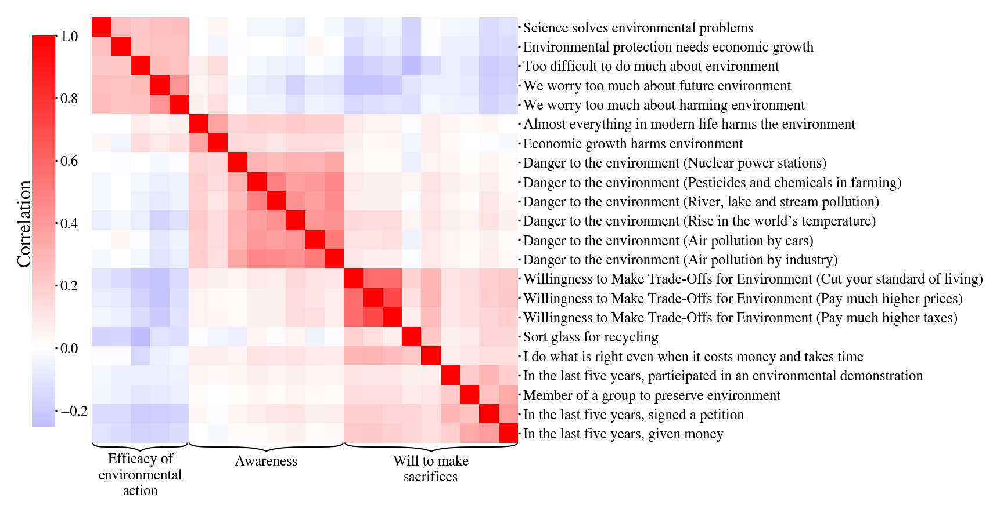

In [10]:
data_issp = pd.read_pickle("../Processed_Data/questionnaires/issp_questionnaires_common.pickle").loc[:,"Questions"]

def conv_answers(label):
    convDict = {
        "Strongly Disagree" : -2,
        "Disagree" : -1,
        "Neither Agree nor Disagree" : 0,
        "Agree" : 1,
        "Strongly Agree" : 2,

        "Yes" : 1,
        "No" : -1,

        'Extremely dangerous': 2,
        'Very dangerous': 1,
        'Somewhat dangerous': 0,
        'Not very dangerous': -1,
        'Not dangerous at all': -2,

        "Always" : 3,
        "Often" : 2,
        "Sometimes" : 1,
        "Never" : 0,

        'Very willing': 2,
        'Fairly willing': 1,
        'Neither willing nor unwilling': 0,
        'Fairly unwilling': -1,
        'Very unwilling': -2
    }
    return convDict[label] if label in convDict else label

clm = sns.clustermap(data_issp.map(conv_answers).astype(float).corr(), cmap="bwr", center=0, cbar_pos=(0.05, 0.65, 0.015, 0.25), method="ward", figsize=(9,9))
clm.ax_row_dendrogram.set_visible(False)
clm.ax_col_dendrogram.set_visible(False)
clm.tick_params(size=1, pad=1, labelsize=6)

#clm.ax_heatmap.set_title("Environmental concern dimensions", fontsize=20);
clm.ax_heatmap.set_xticks([])
clm.ax_heatmap.set_xlabel("")
clm.ax_heatmap.set_ylabel("")
clm.ax_cbar.text(x=-0.25, y=0.4, s="Correlation", fontsize=8, rotation=90, va='center', ha='center')

brace = CurlyBrace(x=0.002, y=-0.02, width=.02, height=0.222, pointing='left', transform=clm.ax_heatmap.transAxes, color='black', linewidth=0.5)
clm.fig.patches.append(brace)
clm.ax_heatmap.text(x=2.5, y=23.7, s="Efficacy of\nenvironmental\naction", fontsize=6, rotation=0, va='center', ha='center')

brace = CurlyBrace(x=0.229, y=-0.02, width=.02, height=0.36, pointing='left', transform=clm.ax_heatmap.transAxes, color='black', linewidth=0.5)
clm.fig.patches.append(brace)
clm.ax_heatmap.text(x=9, y=23, s="Awareness", fontsize=6, rotation=0, va='center', ha='center')

brace = CurlyBrace(x=0.594, y=-0.02, width=.02, height=0.404, pointing='left', transform=clm.ax_heatmap.transAxes, color='black', linewidth=0.5)
clm.fig.patches.append(brace)
clm.ax_heatmap.text(x=17.5, y=23.4, s="Will to make\nsacrifices", fontsize=6, rotation=0, va='center', ha='center')


pass

#clm.savefig("../Figures/environmental_concern_dimensions.pdf", format="pdf")

### Apply clustering

In [3]:
#cluster questions based on topic
clusters = {
    #TOPIC 1: awareness of the environmental consequences of societies’ modern, industrial activities
    "Awareness" : [
        'Almost everything in modern life harms the environment',
        'Economic growth harms environment',
        'Danger to the environment (Air pollution by cars)',
        'Danger to the environment (Air pollution by industry)',
        'Danger to the environment (Pesticides and chemicals in farming)',
        'Danger to the environment (River, lake and stream pollution)',
        'Danger to the environment (Rise in the world’s temperature)',
        'Danger to the environment (Nuclear power stations)'
    ],

    #TOPIC 2: willingness to sacrifice personally in some manner (e.g. time, money) for the environment
    "Will to make sacrifices" : [
        'Willingness to Make Trade-Offs for Environment (Pay much higher prices)',
        'Willingness to Make Trade-Offs for Environment (Pay much higher taxes)',
        'Willingness to Make Trade-Offs for Environment (Cut your standard of living)',
        'Member of a group to preserve environment',
        'In the last five years, signed a petition',
        'In the last five years, given money',
        'In the last five years, participated in an environmental demonstration',
        'I do what is right even when it costs money and takes time',
        'Sort glass for recycling',
    ],
    
    #TOPIC 3: importance of addressing environmental problems and of collective effort for resolving environmental
    #issues and how environmental issues intersect with economic issues, science and progress
    # NB!! answers are rescaled so that higher scores reflect pro-environment responses
    "Efficacy of environmental action" : [
        'We worry too much about harming environment',
        'We worry too much about future environment',
        'Science solves environmental problems',
        'Too difficult to do much about environment',
        'Environmental protection needs economic growth',
    ]
        
}

In [224]:
# get full dataset
data_issp = pd.read_pickle("../Processed_Data/questionnaires/issp_questionnaires_common.pickle").drop(columns=[("Respondent Data", "Weight")])

# convert values to numerical data
conv_dict = {
    "Questions" : {
        "Strongly Disagree" : -2,
        "Disagree" : -1,
        "Neither Agree nor Disagree" : 0,
        "Agree" : 1,
        "Strongly Agree" : 2,

        "Yes" : 1,
        "No" : -1,

        'Extremely dangerous': 2,
        'Very dangerous': 1,
        'Somewhat dangerous': 0,
        'Not very dangerous': -1,
        'Not dangerous at all': -2,

        "Always" : 3,
        "Often" : 2,
        "Sometimes" : 1,
        "Never" : 0,

        'Very willing': 2,
        'Fairly willing': 1,
        'Neither willing nor unwilling': 0,
        'Fairly unwilling': -1,
        'Very unwilling': -2
    }
}

#convert values to numerical
data_resp = data_issp.loc[:, ("Respondent Data", slice(None))]
data_quest = data_issp.loc[:,("Questions", slice(None))].map(lambda x: conv_dict["Questions"].get(x, x)).astype(float)

#rescale and cluster
data_to_cluster = data_quest.apply(lambda x: x if x.name[1] not in clusters["Efficacy of environmental action"] else -x)
data_quest_clustered = pd.concat([pd.concat([data_to_cluster.loc[:, ("Questions", clusters[topic])].sum(axis=1) for topic in clusters], axis=1, keys=clusters.keys())], keys=["Environmental concern dimension"],  names=["Variable Type", "Variable Name"], axis=1)


#get country-wide indicators columns
macro_indicators_dict = {(ind[:-7]) : pd.read_pickle(f"../Processed_Data/indicators/{ind}") for ind in os.listdir("../Processed_Data/indicators") if ind[-7:] == ".pickle"}
data_indic = pd.concat([pd.DataFrame.from_records([data_issp.index.map(lambda idx: indicator.loc[idx[1], idx[0]]) for indicator in macro_indicators_dict.values()], index=macro_indicators_dict.keys(), columns=data_issp.index).T], keys=["Country-wide indicators"], names=["Variable Type", "Variable Name"], axis=1)


#merge into single dataframes
full_dataset = pd.concat([data_resp, data_indic, data_quest_clustered], axis=1) #separate questions



del(data_issp, data_resp, data_to_cluster, data_quest_clustered, macro_indicators_dict, data_indic, conv_dict)

#rescale so all dimensions are in range [-1,+1]
full_dataset.loc[:,("Environmental concern dimension", slice(None))] /= full_dataset.loc[:,("Environmental concern dimension", slice(None))].abs().max()

newcols = {
    "GHG_emissions"     : "Greenhouse gases emissions",
    "PM25_exposure"     : "PM25 exposure",
    "GDP_growth"        : "GDP growth",
    "gini_index"        : "Gini index",
    "GDP_pcap_ppp"      : "GDP per capita (Purchasing Power Parity)",
    "water_withdrawals" : "Water withdrawals",
    "pesticides_use"    : "Pesticides use",
    "GDP_pcap"          : "GDP per capita",
    "internet_usage"    : "Internet usage",
    "CO2_emissions_per_capita" : "CO2 emissions per capita",
    "infant_mortality"  : "Infant mortality"
          }

newcols = {("Country-wide indicators", key) : ("Country-wide indicators", value) for key, value in newcols.items()}

full_dataset.columns = full_dataset.columns.map(lambda x: newcols.get(x,x))

#dump
#full_dataset.to_pickle("../Saved_variables/full_dataset.pickle")
#data_quest.to_pickle("../Saved_variables/data_issp_questions_numerical.pickle")

In [16]:
#quick load
full_dataset = pd.read_pickle("../Saved_variables/full_dataset.pickle")
data_quest = pd.read_pickle("../Saved_variables/data_issp_questions_numerical.pickle")

#### Compute Cronbach's Alphas coefficents

In [216]:
# Function to compute Cronbach's Alpha
def cronbach_alpha(df):
    # Number of items (questions)
    n_items = df.shape[1]
    # Variance of each item
    item_variances = df.var(axis=0, ddof=1)
    # Variance of the total score
    total_variance = df.sum(axis=1).var(ddof=1)
    # Cronbach's alpha calculation
    alpha = (n_items / (n_items - 1)) * (1 - item_variances.sum() / total_variance)
    return alpha

alphas = pd.DataFrame(index=["Awareness", "Will to make sacrifices", "Efficacy of environmental action"], columns=pd.Index([1993, 2000, 2010, 2020], name="Cronbach's alphas"))

df = (data_quest - data_quest.mean())/data_quest.std()
for year in alphas.columns:
    data = df.loc[year].droplevel(axis=1, level=0)
    alpha_awareness = cronbach_alpha(data[clusters["Awareness"]])
    alpha_will = cronbach_alpha(data[clusters["Will to make sacrifices"]])
    alpha_efficacy = cronbach_alpha(data[clusters["Efficacy of environmental action"]])

    alphas[year] = [alpha_awareness, alpha_will, alpha_efficacy]

#print(alphas.to_latex())
alphas

Cronbach's alphas,1993,2000,2010,2020
Awareness,0.725008,0.725716,0.743114,0.751349
Will to make sacrifices,0.680475,0.680667,0.699256,0.708505
Efficacy of environmental action,0.582448,0.577603,0.544326,0.643556


#### Distribution of Environmental concern scores

In [37]:
for col in full_dataset.loc[:,"Environmental concern dimension"].columns:
    uniqueVals = len(full_dataset.loc[:,"Environmental concern dimension"].loc[:,col].unique())
    print(f"{uniqueVals} unique values for {col} scores"

33 unique values for Awareness scores
28 unique values for Will to make sacrifices scores
21 unique values for Efficacy of environmental action scores


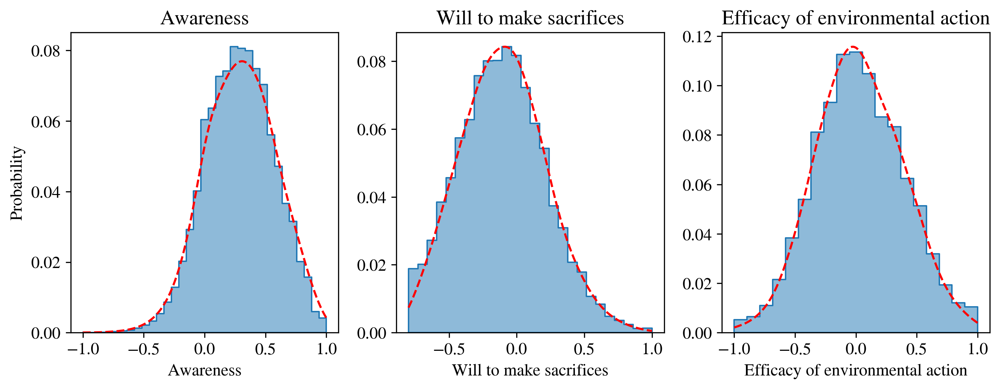

In [119]:
fig, axs = plt.subplots(1,3, figsize=(10,4), sharey=False)
bins=[33,26,19]
for i,col in enumerate(full_dataset.loc[:,"Environmental concern dimension"].columns):
    ax = axs[i]
    sns.histplot(full_dataset.loc[:,"Environmental concern dimension"][col], bins=bins[i], element="step", kde=True, kde_kws = {"bw_method" : 0.25}, line_kws = {"ls" : "--", "lw":1.5}, stat="probability", ax=ax)
    #full_dataset.loc[:,"Environmental concern dimension"][col].hist(bins=bins[i], density=True, ax=ax)
    ax.set_title(col)
    ax.lines[0].set_color('red')
    if i!=0:
        ax.set_ylabel("")
plt.tight_layout()
fig.savefig("../Figures/environmental_concern_scores_distributions.pdf", format="pdf")

___
# Correlation Between Indicators

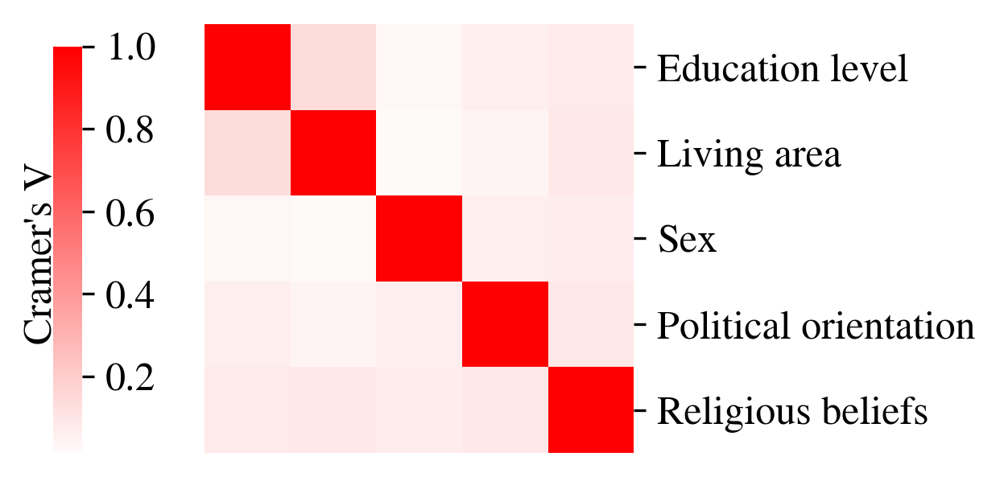

In [23]:
from scipy.stats import chi2_contingency

micro_ind_df = pd.read_pickle("../Processed_Data/questionnaires/issp_questionnaires_common.pickle").loc[:,"Respondent Data"].select_dtypes(include="category").dropna()
corr_matrix = pd.DataFrame(1, index=micro_ind_df.columns.values, columns=micro_ind_df.columns.values, dtype="float")

for i in corr_matrix.index:
    for j in corr_matrix.columns:
        if i != j:
            crosstab = pd.crosstab(micro_ind_df[i], micro_ind_df[j])
            chi2 = chi2_contingency(crosstab)[0]
            n = crosstab.sum().sum()
            phi2 = chi2/n
            r,k = crosstab.shape
            phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
            rcorr = r - ((r-1)**2)/(n-1)
            kcorr = k - ((k-1)**2)/(n-1)
            corr_matrix.loc[i,j] = np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))

clm = sns.clustermap(corr_matrix, center=0, cmap="bwr", cbar_pos=(0, 0.4, 0.03, 0.42), method="ward", figsize=(4,4))
clm.ax_row_dendrogram.set_visible(False)
clm.ax_col_dendrogram.set_visible(False)
#clm.tick_params(size=1, pad=1, labelsize=6)
#clm.ax_heatmap.set_yticklabels(clm.ax_heatmap.get_ymajorticklabels(), fontsize=10, rotation=0)
#clm.ax_cbar.set_yticklabels(clm.ax_cbar.get_ymajorticklabels(), fontsize=10)

#clm.ax_heatmap.set_title("Cramér's V for categorical micro indicators", fontsize=20);
clm.ax_heatmap.set_xticks([])
clm.ax_heatmap.set_xlabel("")
clm.ax_heatmap.set_ylabel("")

clm.ax_cbar.text(x=-1, y=0.5, s="Cramer's V", rotation=90, va="center")


#clm.savefig("../Figures/indicators_corr_categorical.pdf", format="pdf")

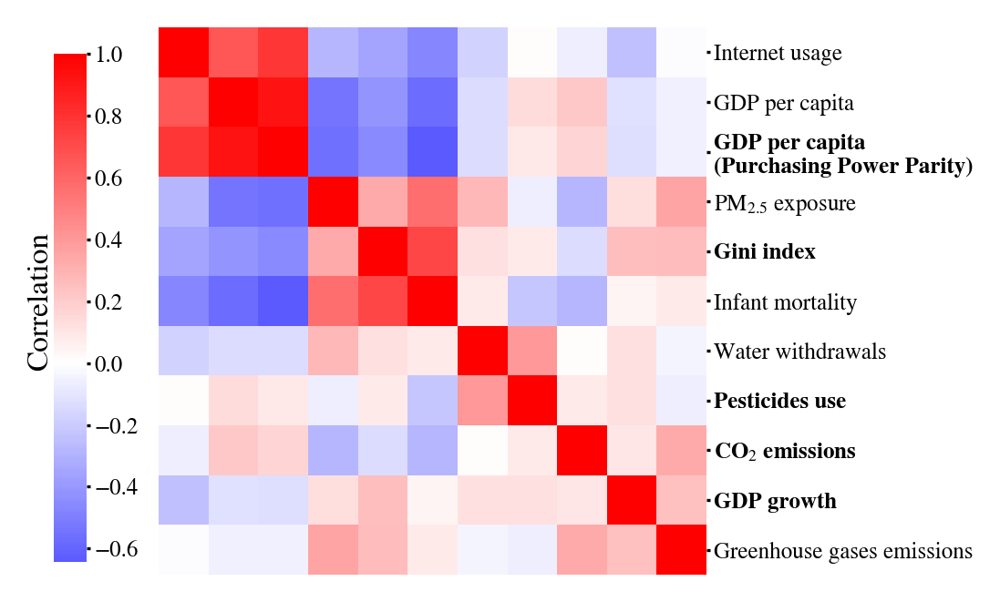

In [117]:
data_issp = pd.read_pickle("../Processed_Data/questionnaires/issp_questionnaires_common.pickle")

macro_indicators_dict = {(ind[:-7]) : pd.read_pickle(f"../Processed_Data/indicators/{ind}") for ind in os.listdir("../Processed_Data/indicators") if ind[-7:] == ".pickle"}
macro_ind_df = pd.concat([pd.DataFrame.from_records([data_issp.index.droplevel("Unique ID").unique().map(lambda idx: indicator.loc[idx[1], idx[0]]) for indicator in macro_indicators_dict.values()], index=macro_indicators_dict.keys(), columns=data_issp.index.droplevel("Unique ID").unique()).T], keys=["Country-wide indicators"], names=["Variable Type", "Variable Name"], axis=1)

#rename macro indicators columns
newcols = {
    "GHG_emissions"     : "Greenhouse gases emissions",
    "PM25_exposure"     : "PM25 exposure",
    "GDP_growth"        : "GDP growth",
    "gini_index"        : "Gini index",
    "GDP_pcap_ppp"      : "GDP per capita (Purchasing Power Parity)",
    "water_withdrawals" : "Water withdrawals",
    "pesticides_use"    : "Pesticides use",
    "GDP_pcap"          : "GDP per capita",
    "internet_usage"    : "Internet usage",
    "CO2_emissions_per_capita" : "CO2 emissions per capita",
    "infant_mortality"  : "Infant mortality"
          }

newcols = {("Country-wide indicators", key) : ("Country-wide indicators", value) for key, value in newcols.items()}

macro_ind_df.columns = macro_ind_df.columns.map(lambda x: newcols.get(x,x))

corr_matrix = macro_ind_df.corr()
corr_matrix.columns = corr_matrix.columns.droplevel(0)
corr_matrix.index = corr_matrix.index.droplevel(0)

clm = sns.clustermap(corr_matrix, cmap="bwr", center=0, cbar_pos=(0.05, 0.56, 0.02, 0.31), method="ward", figsize=(6,6))
clm.ax_row_dendrogram.set_visible(False)
clm.ax_col_dendrogram.set_visible(False)
clm.tick_params(size=1, pad=1, labelsize=6)
#clm.ax_heatmap.set_yticklabels(clm.ax_heatmap.get_ymajorticklabels(), fontsize=10)
#clm.ax_cbar.set_yticklabels(clm.ax_cbar.get_ymajorticklabels(), fontsize=10)

#clm.ax_heatmap.set_title("Correlations between macro indicators", fontsize=20);
clm.ax_heatmap.set_xticks([])
clm.ax_heatmap.set_xlabel("")
clm.ax_heatmap.set_ylabel("")

clm.ax_cbar.text(x=-0.8, y=0.2, s="Correlation",fontsize=8, rotation=90, va="center")

macro_indicators = ["GDP growth", "Gini index", "GDP per capita (Purchasing Power Parity)", "Pesticides use", "CO2 emissions per capita"]
corr_labels = {
                    "GDP per capita (Purchasing Power Parity)" : "GDP per capita\n(Purchasing Power Parity)",
                    "CO2 emissions per capita" : r"CO${}_2$ emissions",
                    "PM25 exposure" : r"PM${}_{2.5}$ exposure"
                }

ticklabels_old = [t.get_text() for t in clm.ax_heatmap.get_yticklabels()]
ticklabels_new = [corr_labels.get(t.get_text(), t.get_text()) for t in clm.ax_heatmap.get_yticklabels()]
clm.ax_heatmap.set_yticklabels(ticklabels_new)

for i,tick_label in enumerate(clm.ax_heatmap.get_yticklabels()):
    if ticklabels_old[i] in macro_indicators:
        tick_label.set_fontweight("black")
        
        
clm.savefig("../Figures/indicators_corr_macro.pdf", format="pdf")

___
# Countries clustering

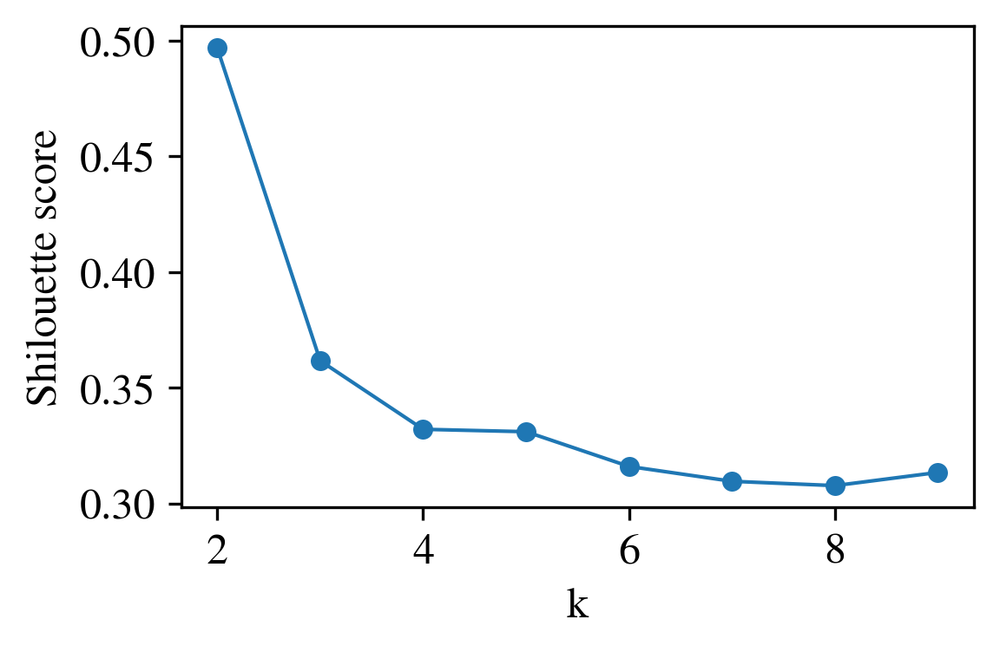

In [120]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

sil = []
data = pd.read_pickle("../Saved_variables/full_dataset.pickle").loc[:, "Environmental concern dimension"].groupby("Country").mean()
for k in range(2, 10):
  kmeans = KMeans(n_clusters = k, n_init=500).fit(data)
  labels = kmeans.labels_
  sil.append(silhouette_score(data, labels, metric = 'euclidean'))

fig, ax = plt.subplots(figsize=(4,8/3))
sns.scatterplot(x=np.arange(2,10), y=sil, ax=ax)
sns.lineplot(x=np.arange(2,10), y=sil, ax=ax, lw=1)
ax.set_ylabel("Shilouette score")
ax.set_xlabel("k")

plt.tight_layout()

#fig.savefig("../Figures/shilouette_clustering.pdf", format="pdf")

In [121]:
nClusters = 2

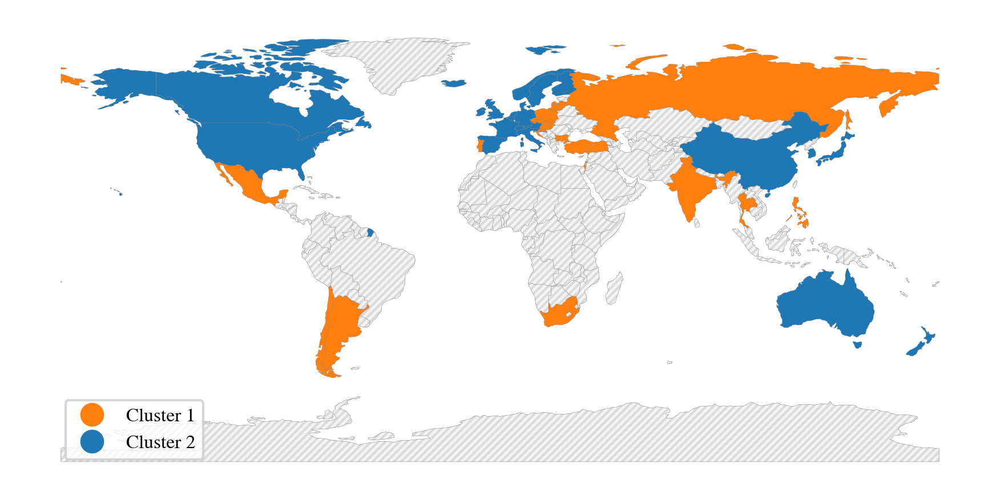

In [123]:
from sklearn.cluster import KMeans
import geopandas as gpd

cluster = KMeans(nClusters, n_init=1000)
data = pd.read_pickle("../Saved_variables/full_dataset.pickle").loc[:, "Environmental concern dimension"].groupby("Country").mean()
data["cluster"] = cluster.fit_predict(data)

countries_cluster = {index : data.loc[:,"cluster"].map(lambda x: f"Cluster {x+1}").loc[index] for index in data.index}

worldmap = gpd.GeoDataFrame(pd.read_pickle("../Processed_Data/misc/worldmap.pickle"))
worldmap.index.name = "Country"
c_names = {
    "United States of America" : "United States",
    "South Korea" : "South Korea",
    "Turkey" : "Turkiye",
}
worldmap.index = worldmap.index.map(lambda c: c_names.get(c,c))
worldmap_issp = worldmap.loc[[c for c in worldmap.index if c in data.index]]
worldmap_other = worldmap.loc[[c for c in worldmap.index if c not in data.index]]

fig, ax = plt.subplots()

cmap = mpl.colors.ListedColormap(['tab:orange', 'tab:blue'])

worldmap_issp["cluster"] = data["cluster"].astype("category")
worldmap_issp = worldmap_issp.sort_values(by=["cluster"])
worldmap_issp.plot(column="cluster", cmap=cmap, edgecolor="grey", linewidth=0.1, ax=ax, legend=True)
worldmap_other.plot(color=[1,1,1], edgecolor="gray", linewidth=0.1, hatch="////////", ax=ax)
worldmap_other.plot(edgecolor="gray", linewidth=0.1, color=[0.95,0.95,0.95], alpha=0.8, ax=ax)
ax.axis("off")

handles = ax.get_legend().legend_handles

ax.get_legend().remove()
plt.legend(handles,["Cluster 1", "Cluster 2"], fontsize=8, loc=(.05,.05))
ax.get_legend().handletextpad = 0

fig.tight_layout()
#fig.savefig(f"../Figures/countries_clustering_{nClusters}clusters.pdf", format="pdf")

___
# Trends by year and region

run "Countries clustering" before to obtain clusters

In [8]:
full_dataset = pd.read_pickle("../Saved_variables/full_dataset.pickle")

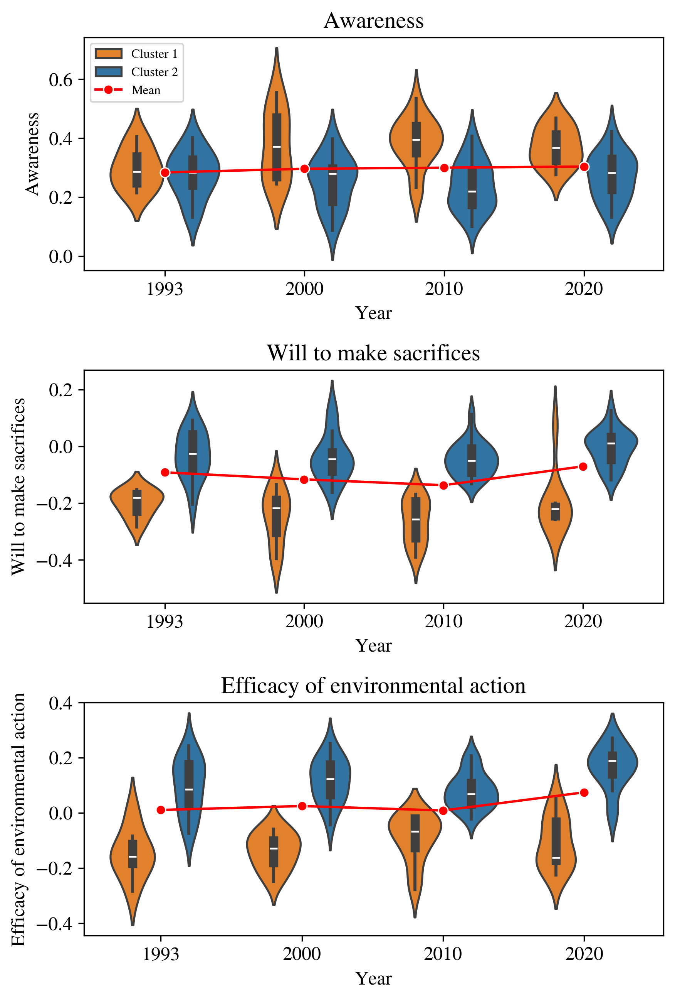

In [129]:
fig, axs = plt.subplots(3,1, figsize=(plt.rcParams["figure.figsize"][0], plt.rcParams["figure.figsize"][1]*2.2))
for i,topic in enumerate(full_dataset.loc[:,"Environmental concern dimension"].columns):
    ax = axs[i]
    ax.set_title(f"{topic}")
    df = full_dataset.loc[:,"Environmental concern dimension"].groupby(["Year", "Country"]).mean().reset_index()
    df["Cluster"] = df["Country"].map(countries_cluster)
    df = df.sort_values(by=["Cluster"])

    cmap = sns.color_palette(["tab:orange", "tab:blue"])
    sns.violinplot(data=df, x="Year", y=topic, hue="Cluster", palette=cmap, gap=0.05, ax=ax)
    
    # Calculate the mean for each category to plot as a trendline
    category_means = df.groupby('Year')[topic].mean().reset_index().reset_index()

    # Add a trendline based on the category means
    sns.lineplot(x="index", y=topic, data=category_means, marker='o', color='red', label="Mean",ax=ax)
    if i==0:
        handles, labels = ax.get_legend_handles_labels()
        dict_labels = {label : handles[i] for i,label in enumerate(labels)}
        new_labels = sorted(labels)
        handles = [dict_labels[label] for label in new_labels]
        ax.legend(handles, new_labels, loc="upper left", fontsize=8)
    else:
        ax.get_legend().remove()
    plt.tight_layout()
    
#fig.savefig(f"../Figures/envDimensions_vs_years_regions.pdf", format="pdf")

___
# Trends by individual and Country-Wide Indicators

In [3]:
#get dataset
full_dataset = pd.read_pickle("../Saved_variables/full_dataset.pickle")

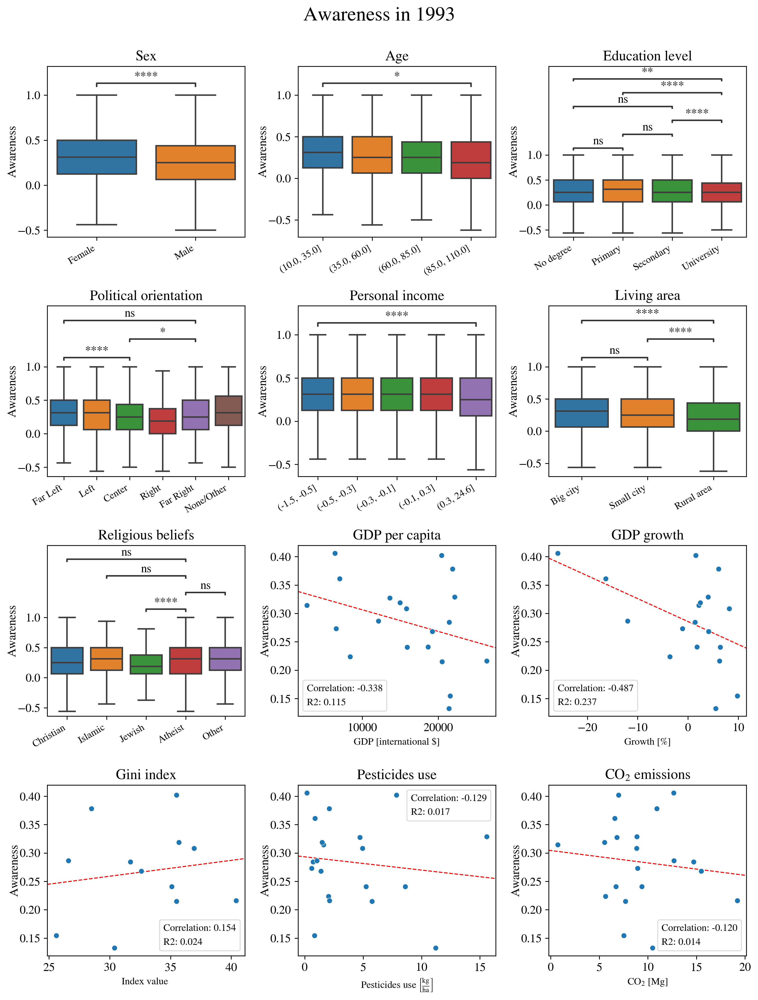

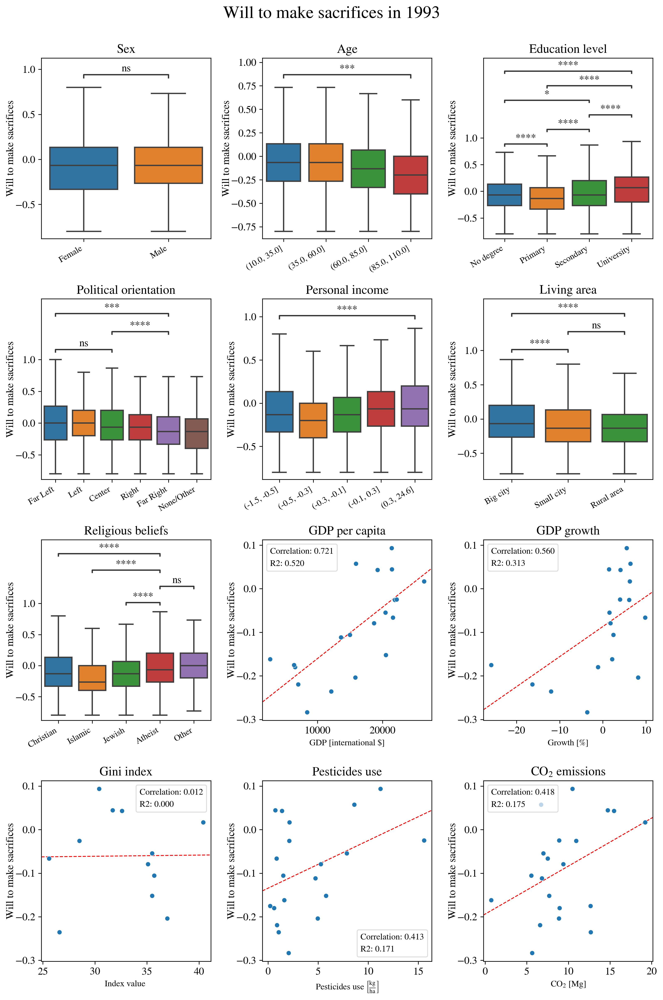

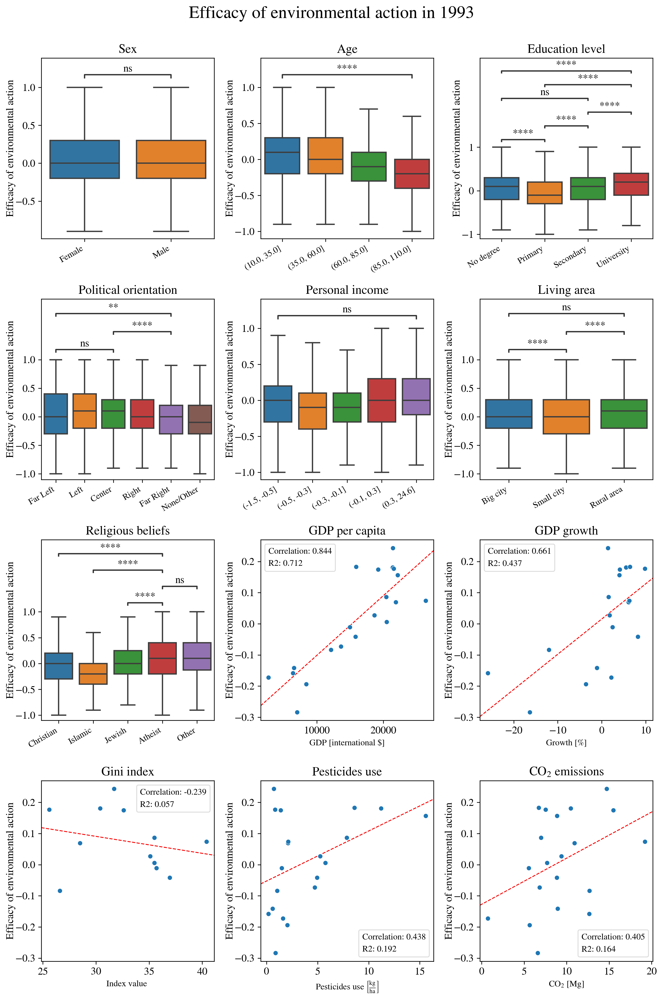

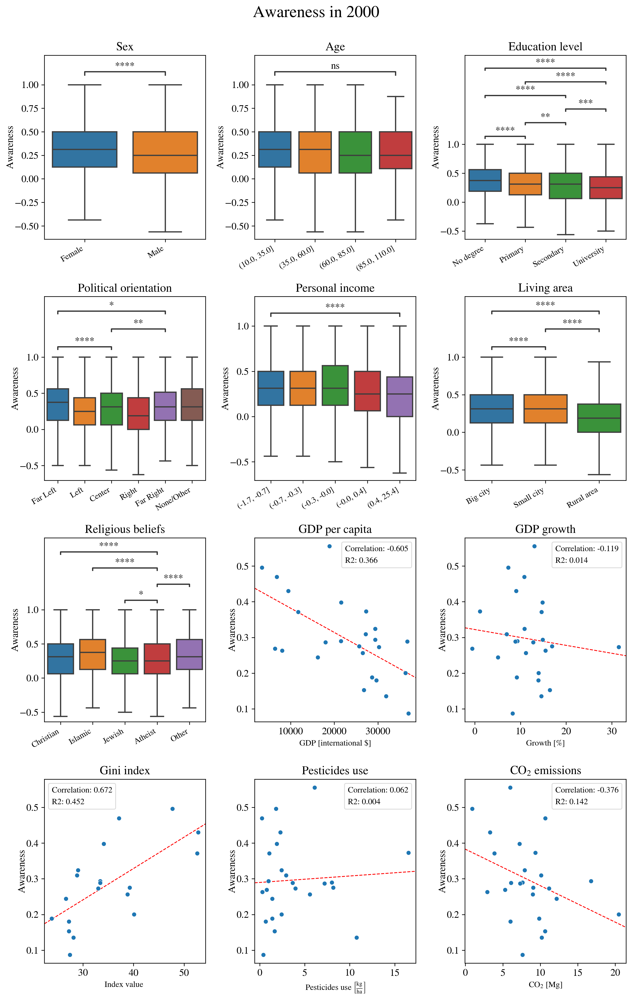

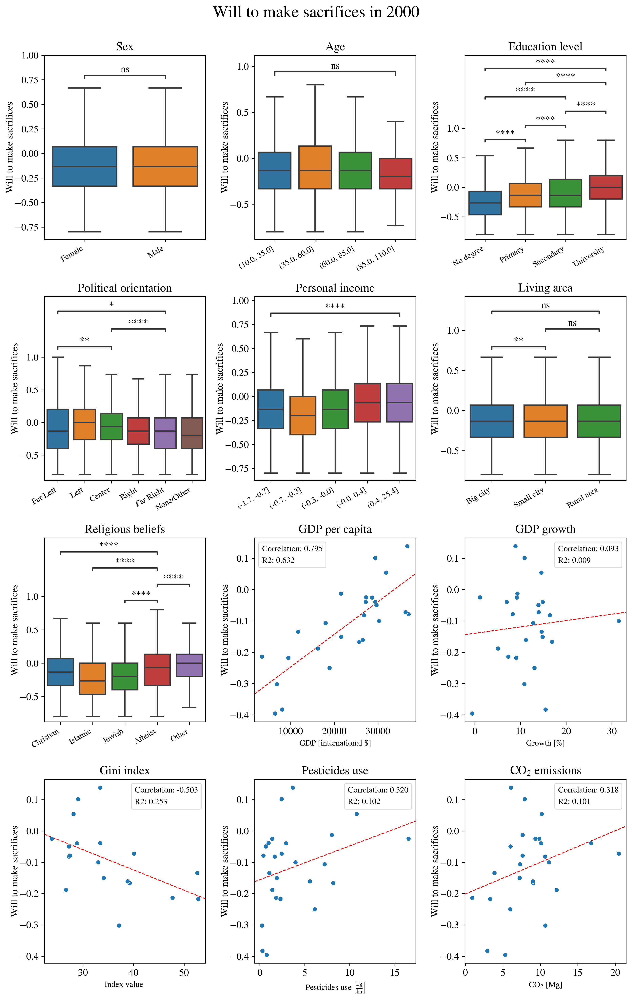

...

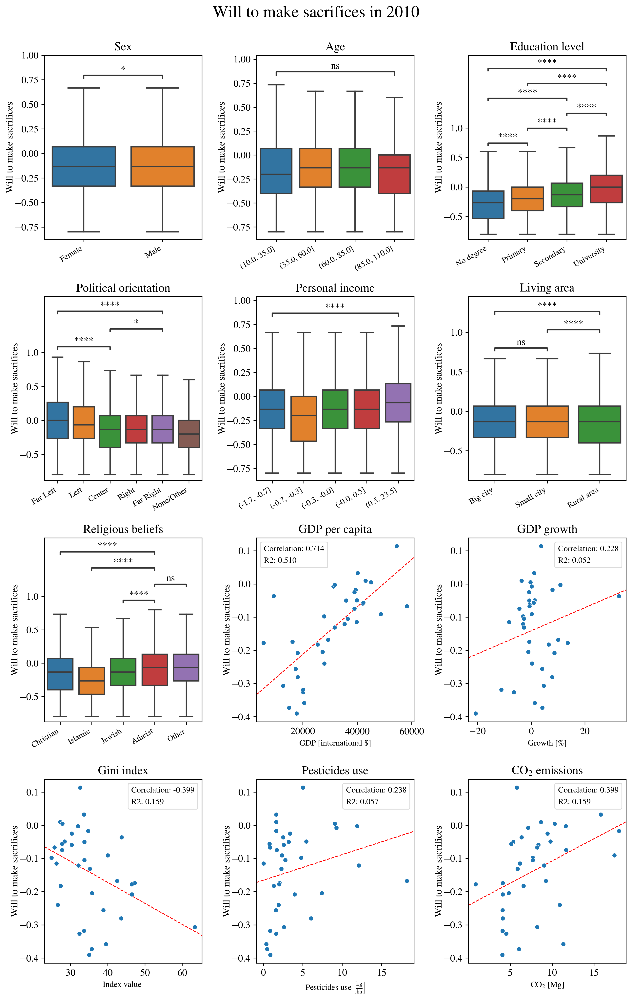

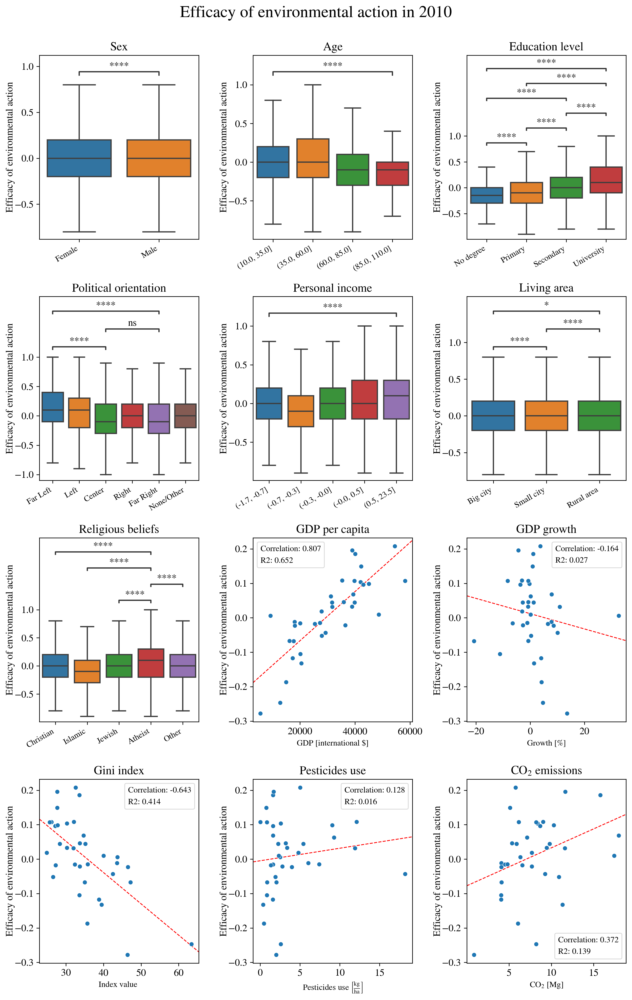

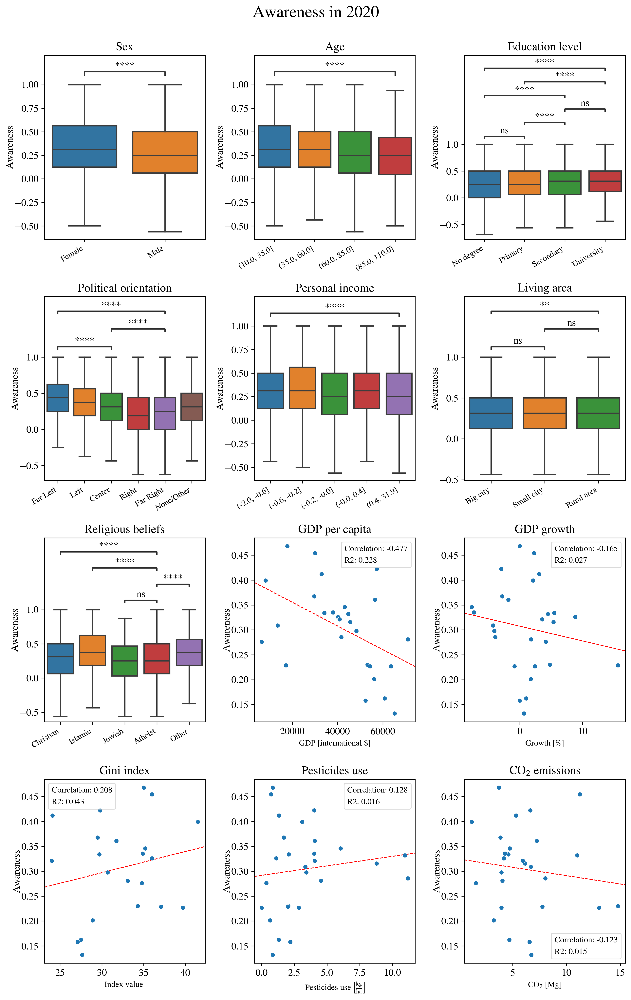

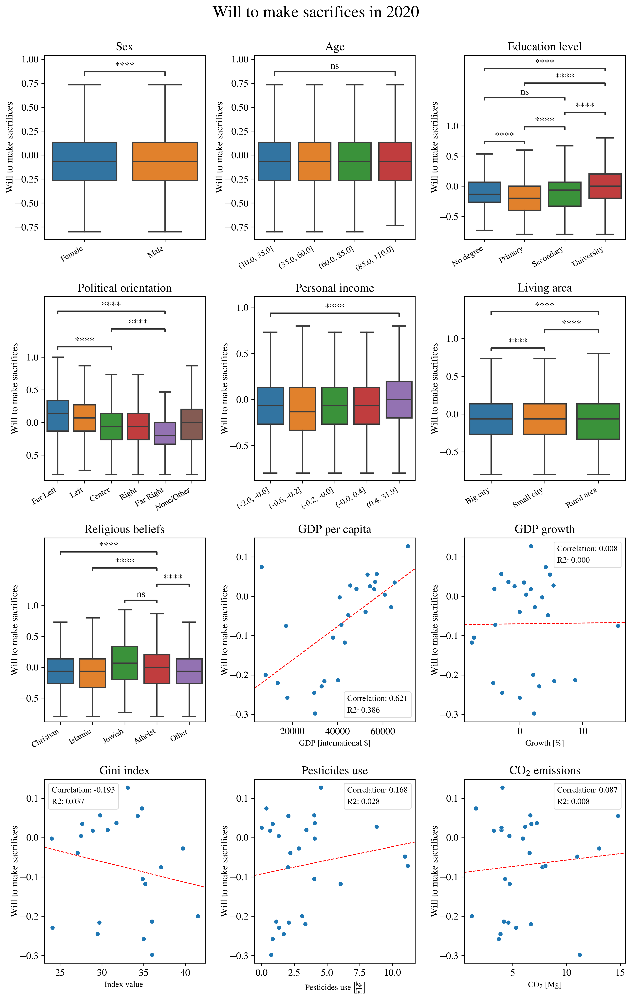

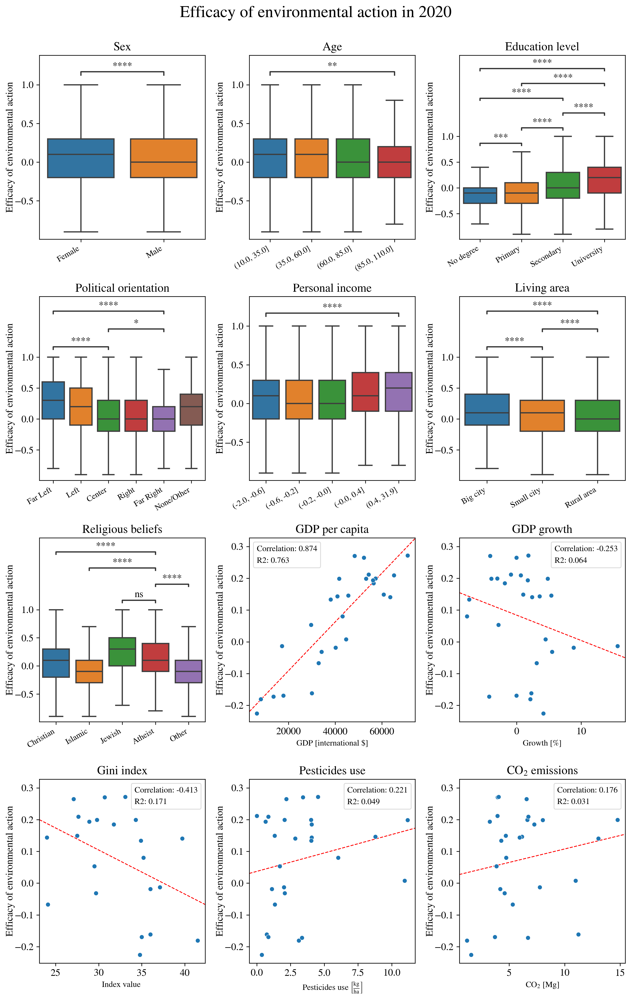

In [13]:
#plot answers vs indicators

from statannotations.Annotator import Annotator
from sklearn.linear_model import LinearRegression
import matplotlib.patches as mpl_patches

micro_indicators = ['Sex', 'Age', 'Education level', 'Political orientation', 'Personal income', 'Living area', 'Religious beliefs']
macro_indicators = ["GDP per capita (Purchasing Power Parity)", "GDP growth", "Gini index", "Pesticides use", "CO2 emissions per capita"]
indicators = micro_indicators + macro_indicators

from itertools import combinations

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for year in [1993,2000,2010,2020]:
        for topic in full_dataset.loc[year, "Environmental concern dimension"].columns:
            n_plots = len(indicators)
            size_x, size_y = plt.rcParams["figure.figsize"]
            if (topic, year) == ("Awareness", 1993):
                fig, axs = plt.subplots(4,3, figsize=(1.8*size_x, 3.5*size_y), sharey=False)
            elif year == 1993:
                fig, axs = plt.subplots(4,3, figsize=(1.8*size_x, 4*size_y), sharey=False)
            else:
                fig, axs = plt.subplots(4,3, figsize=(1.8*size_x, 4.2*size_y), sharey=False)
            fig.suptitle(f"{topic} in {year}", size=20, y=1)
            for i, indicator in enumerate(indicators):
                #print(f"Computing effect of {indicator} for {topic} in {year}", flush=True)
                ax = axs[i//3][i%3]

                if indicator == "Personal income":
                    df = full_dataset.loc[year].droplevel(level=0, axis=1).loc[:,[indicator, topic]]
                    df["bins"] = pd.qcut(df.loc[:,indicator], q=5)
                    df[indicator] = df["bins"].map(lambda x: np.nan if pd.isna(x) else f"({round(x.left,1)}, {round(x.right,1)}]")
                    sns.boxplot(data=df, x=indicator, y=topic, ax=ax, showfliers=False)

                    values = df[indicator].cat.categories
                    pairs = [(values[0], values[-1])]
                    
                    annot = Annotator(ax, pairs, data=df, x=indicator, y=topic)
                    annot.configure(test='t-test_welch', text_format='star', show_test_name=False, loc='inside', comparisons_correction="Bonferroni", verbose=0)
                    annot.apply_test()
                    annot.annotate()

                  
                    del(df, annot)
                
                elif indicator == "Age":
                    df = full_dataset.loc[year].droplevel(level=0, axis=1).loc[:,[indicator, topic]]
                    df["bins"] = pd.cut(df.loc[:,indicator], bins=np.linspace(10, 110, 5))
                    df[indicator] = df["bins"]
                    sns.boxplot(data=df, x=indicator, y=topic, ax=ax, showfliers=False)

                    values = df[indicator].cat.categories
                    pairs = [(values[0], values[-1])]
                    
                    annot = Annotator(ax, pairs, data=df, x=indicator, y=topic)
                    annot.configure(test='t-test_welch', text_format='star', show_test_name=False, loc='inside', comparisons_correction="Bonferroni", verbose=0)
                    annot.apply_test()
                    annot.annotate()

                   
                    del(df, annot)

                elif indicator == "Religious beliefs":
                    df = full_dataset.loc[year].droplevel(level=0, axis=1).loc[:,[indicator, topic]]
                    sns.boxplot(data=df, x=indicator, y=topic, showfliers=False, ax=ax)

                    pairs = [(rel, "Atheist") for rel in ["Christian", "Islamic", "Jewish", "Other"]]
                    annot = Annotator(ax, pairs, data=df, x=indicator, y=topic)
                    annot.configure(test='t-test_welch', text_format='star', show_test_name=False, loc='inside', comparisons_correction="Bonferroni", verbose=0)
                    annot.apply_test()
                    annot.annotate()

                   
                    del(df, annot)

                elif indicator == "Political orientation":
                    df = full_dataset.loc[year].droplevel(level=0, axis=1).loc[:,[indicator, topic]]
                    sns.boxplot(data=df, x=indicator, y=topic, showfliers=False, ax=ax)

                    pairs = list(combinations(["Far Left", "Center", "Far Right"], 2))
                    annot = Annotator(ax, pairs, data=df, x=indicator, y=topic)
                    annot.configure(test='t-test_welch', text_format='star', show_test_name=False, loc='inside', comparisons_correction="Bonferroni", verbose=0)
                    annot.apply_test()
                    annot.annotate()

                    
                    del(df, annot)
                
                elif full_dataset.loc[year].droplevel(axis=1, level=0).dtypes[indicator] == "category":
                    df = full_dataset.loc[year].droplevel(level=0, axis=1).loc[:,[indicator, topic]]
                    sns.boxplot(data=df, x=indicator, y=topic, showfliers=False, ax=ax)

                    pairs = list(combinations(df[indicator].cat.categories, 2))
                    annot = Annotator(ax, pairs, data=df, x=indicator, y=topic)
                    annot.configure(test='t-test_welch', text_format='star', show_test_name=False, loc='inside', comparisons_correction="Bonferroni", verbose=0)
                    annot.apply_test()
                    annot.annotate()

                    
                    del(df, annot)

                    
                elif indicator in macro_indicators:
                    df = full_dataset.loc[year].droplevel(level=0, axis=1).loc[:,[indicator, topic]].groupby("Country").mean()
                    sns.scatterplot(data=df, x=indicator, y=topic, ax=ax, s=30)

                    model = LinearRegression()
                    model.fit(df.dropna()[[indicator]], df.dropna()[topic])
                    R2 = model.score(df.dropna()[[indicator]], df.dropna()[topic])
                    a, b = model.coef_[0], model.intercept_
                    x_min, x_max = df[indicator].min(), df[indicator].max()
                    ax.axline((x_min, a*x_min + b), (x_max, a * x_max + b), ls="--", c="red", lw=1, zorder=0) 

                    
                    corr = df.corr().loc[indicator, topic]
                    #ax.annotate(f"Correlation: {corr:.3f}\n\nR2: {R2:.3f}", (0.2,0.67), xycoords='axes fraction')

                    # create a list with two empty handles (or more if needed)
                    handles = [mpl_patches.Rectangle((0, 0), 1, 1, fc="white", ec="white", 
                                                     lw=0, alpha=0)] * 2
                    
                    # create the corresponding number of labels (= the text you want to display)
                    labels = []
                    labels.append(f"Correlation: {corr:.3f}")
                    labels.append(f"R2: {R2:.3f}")
                    
                    # create the legend, supressing the blank space of the empty line symbol and the
                    # padding between symbol and label by setting handlelenght and handletextpad
                    ax.legend(handles, labels, loc='best', fontsize=10, 
                              fancybox=True, framealpha=0.7, 
                              handlelength=0, handletextpad=0)

                    if indicator == "GDP per capita (Purchasing Power Parity)":
                        ylim = ax.get_ylim()
                        ticks = ax.get_yticks()
                    else:
                        ax.set_yticks(ticks)
                        ax.set_ylim(ylim)

                    del(df, model, R2)

                else:
                    raise ValueError("Missing action for indicator")

                corr_labels = {
                    "GDP per capita (Purchasing Power Parity)" : "GDP per capita",
                    "CO2 emissions per capita" : r"CO${}_2$ emissions",
                    "PM25 exposure" : r"PM${}_{2.5}$ exposure"
                }

                x_axis_units = {
                    "CO2 emissions per capita" : "[Mg]",
                    "PM25 exposure" : r"$\left[\frac{\mu\text{g}}{\text{m}^3}\right]$",
                    "GDP growth" : "[%]",
                    "GDP per capita (Purchasing Power Parity)" : "[international $]",
                    "Pesticides use" : r"$\left[\frac{\text{kg}}{\text{ha}}\right]$"
                    
                }

                x_axis_labels = {
                    'PM25 exposure': r'PM${}_{2.5}$',
                    'GDP growth': 'Growth',
                    'Gini index': 'Index value',
                    'GDP per capita (Purchasing Power Parity)': 'GDP',
                    'CO2 emissions per capita': r'CO${}_2$',
                }
                
                ax.set_title(f"{corr_labels.get(indicator, indicator)}")
                
                ax.set_ylabel(topic, loc="center", labelpad=-0.5)
                if indicator in macro_indicators:
                    ax.set_xlabel(f"{x_axis_labels.get(indicator, indicator)}"+f" {x_axis_units.get(indicator, "")}", fontsize=10, loc="center")
                else:
                    ax.set_xlabel("")

                if full_dataset.loc[year].droplevel(axis=1, level=0).dtypes[indicator] == "category" or indicator in ["Age", "Personal income"]:
                    ax.set_xticklabels(ax.get_xticklabels(which="both"), fontsize=10, rotation=30, horizontalalignment="right")

                if indicator not in macro_indicators:
                    ymin, ymax = ax.get_ylim()
                    ax.set_yticks([tick for tick in ax.get_yticks() if tick<=1 and tick>=ymin])
            
            plt.tight_layout()

            
            #fig.savefig(f"../Figures/{topic}_vs_indicators_{year}.pdf", format="pdf")

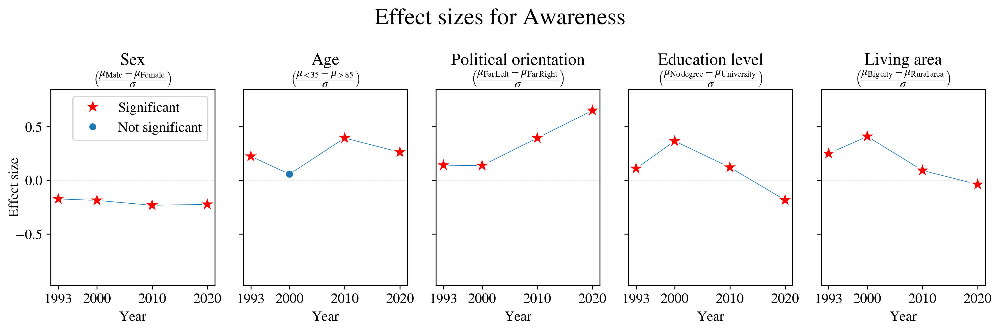

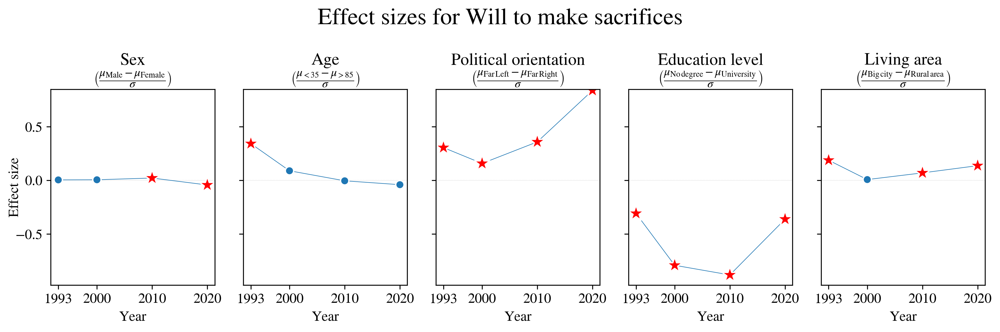

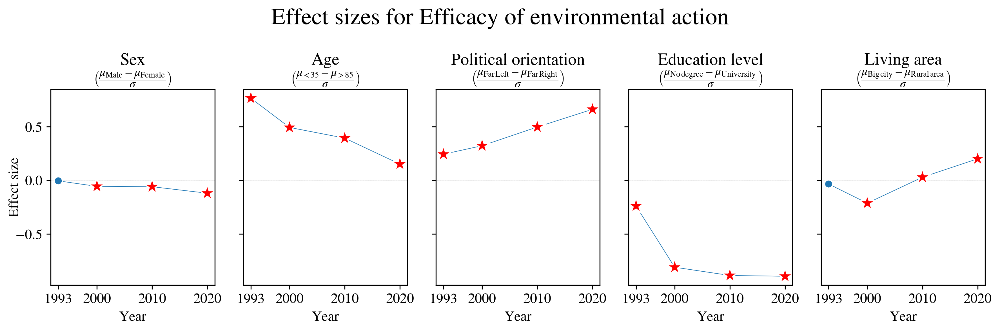

In [134]:
#plot effect size vs years for individual data

from scipy.stats import mannwhitneyu

indic_to_plot = {
    "Sex" : ["== 'Male'", " == 'Female'"],
    "Age" : ["<35", ">85"],
    "Political orientation" : ["=='Far Left'", "=='Far Right'"],
    "Education level" : ["=='No degree'", "=='University'"],
    "Living area" : ["== 'Big city'", " == 'Rural area'"],
}

effect_size_labels = {
    "Sex" : r"$\left(\dfrac{\mu_{\mathrm{Male}}-\mu_{\mathrm{Female}}}{\sigma}\right)$",
    "Age" : r"$\left(\dfrac{\mu_{<35}-\mu_{>85}}{\sigma}\right)$",
    "Political orientation" : r"$\left(\dfrac{\mu_{\mathrm{Far\,Left}}-\mu_{\mathrm{Far\,Right}}}{\sigma}\right)$",
    "Education level" : r"$\left(\dfrac{\mu_{\mathrm{No\,degree}}-\mu_{\mathrm{University}}}{\sigma}\right)$",
    "Living area" : r"$\left(\dfrac{\mu_{\mathrm{Big\,city}}-\mu_{\mathrm{Rural\,area}}}{\sigma}\right)$",
}   

effect_size_ylabels = {
    "Sex" : r"$\frac{\mu_{\mathrm{Male}}-\mu_{\mathrm{Female}}}{\sigma}$",
    "Age" : r"$\frac{\mu_{<35}-\mu_{>85}}{\sigma}$",
    "Political orientation" : r"$\frac{\mu_{\mathrm{Far\,Left}}-\mu_{\mathrm{Far\,Right}}}{\sigma}$",
    "Education level" : r"$\frac{\mu_{\mathrm{No\,degree}}-\mu_{\mathrm{University}}}{\sigma}$",
    "Living area" : r"$\frac{\mu_{\mathrm{Big\,city}}-\mu_{\mathrm{Rural\,area}}}{\sigma}$",
}   


for topic in full_dataset.loc[:,"Environmental concern dimension"].columns:
    size_x, size_y = plt.rcParams["figure.figsize"]
    fig, axs = plt.subplots(1, 5, figsize=(2*size_x, size_y), sharey=True)
    fig.suptitle(f"Effect sizes for {topic}", size=20)
    for i, indicator in enumerate(indic_to_plot.keys()):
        effect_sizes = []
        significant = []
        for year in [1993, 2000, 2010, 2020]:
            df = full_dataset.droplevel(axis=1, level=0).loc[year, [indicator, topic]]

            eff_size = (df.query(f"`{indicator}` {indic_to_plot[indicator][0]}")[topic].mean() - df.query(f"`{indicator}` {indic_to_plot[indicator][1]}")[topic].mean()) / df[topic].std()
            p_val = mannwhitneyu(df.query(f"`{indicator}` {indic_to_plot[indicator][0]}")[topic], df.query(f"`{indicator}` {indic_to_plot[indicator][1]}")[topic])[1]
            
            effect_sizes.append(eff_size)
            significant.append("Significant" if p_val < 0.05 else "Not significant")

            del(df)

        #plot
        ax = axs[i]
        ax.axline((1993,0,),(2020,0), lw=0.1, ls='--', color="gray", zorder=0)
        sns.lineplot(x=[1993, 2000, 2010, 2020], y=effect_sizes, lw=0.5, ax=ax, zorder=1)
        sns.scatterplot(x=[1993, 2000, 2010, 2020], y=effect_sizes, style=significant, hue=significant, palette = {"Significant" : "red", "Not significant" : sns.color_palette("tab10")[0]}, markers = {"Significant" : "*", "Not significant" : "."}, s=200, style_order=["Significant", "Not significant"], hue_order=["Significant", "Not significant"], ax=ax)
        
        ax.set_title(f"{indicator}\n")
        ax.text(0.5,1.03, f"{effect_size_labels[indicator]}", ha="center", fontsize=10, transform=ax.transAxes)
        ax.set_ylabel("Effect size", loc="center", labelpad=-5)
        #ax.set_ylabel(f"{effect_size_ylabels[indicator]}", labelpad=-5)
        ax.set_xticks([1993,2000,2010,2020])
        ax.set_xlabel("Year", loc="center")


        ax.set_yticks([-1. , -0.5,  0. ,  0.5,  1. ])
        ax.set_ylim((-0.9764503872330917, 0.8494222270191483))
        
        if i>0 or topic!="Awareness":
            ax.get_legend().remove()
        plt.tight_layout()
        

    #plt.savefig(f"../Figures/effectSizes_{topic}.pdf", format="pdf")   

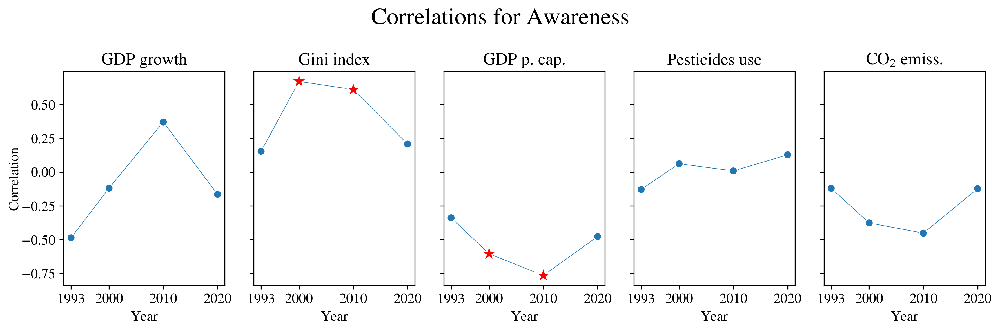

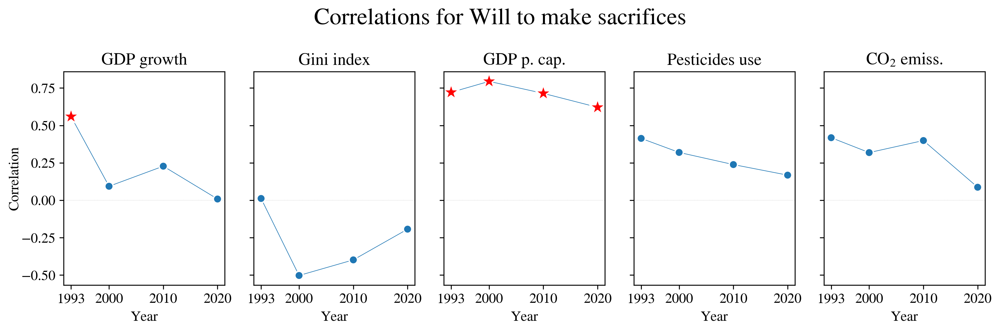

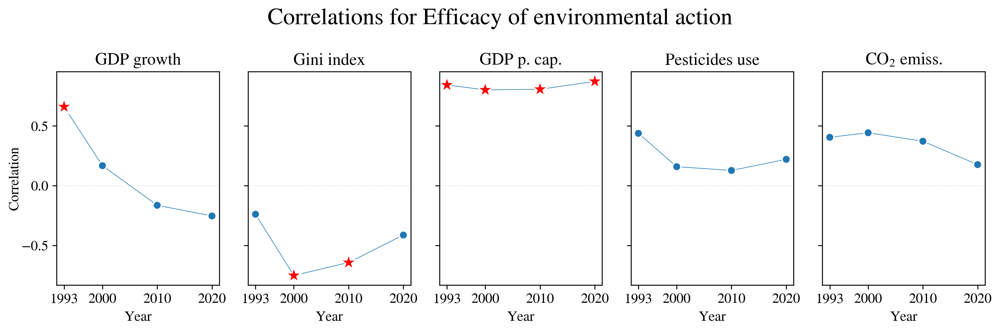

In [136]:
#plot correlation vs years for country-wide data

from sklearn.linear_model import LinearRegression

for topic in full_dataset.loc[:,"Environmental concern dimension"].columns:
    size_x, size_y = plt.rcParams["figure.figsize"]
    fig, axs = plt.subplots(1, 5, figsize=(2*size_x, size_y), sharey=True)
    fig.suptitle(f"Correlations for {topic}", size=20)
    for i, indicator in enumerate(["GDP growth", "Gini index", "GDP per capita (Purchasing Power Parity)", "Pesticides use", "CO2 emissions per capita"]):
        correlations = []
        significant = []
        for year in [1993, 2000, 2010, 2020]:
            df = full_dataset.droplevel(axis=1, level=0).loc[year, [indicator, topic]].groupby("Country").mean()

            corr = df.corr().loc[indicator, topic]
            
            model = LinearRegression()
            model.fit(df.dropna()[[indicator]], df.dropna()[topic])
            R2 = model.score(df.dropna()[[indicator]], df.dropna()[topic])
            
            correlations.append(corr)
            significant.append(r"Significant $(R^2>0.3)$" if R2 > 0.3 else "Not significant")

            del(df)

        #plot
        ax = axs[i]
        ax.axline((1993,0,),(2020,0), lw=0.1, ls='--', color="gray", zorder=0)
        sns.lineplot(x=[1993, 2000, 2010, 2020], y=correlations, lw=0.5, ax=ax, zorder=1)
        sns.scatterplot(x=[1993, 2000, 2010, 2020], y=correlations, style=significant, hue=significant, palette = {r"Significant $(R^2>0.3)$" : "red", "Not significant" : sns.color_palette("tab10")[0]}, markers = {r"Significant $(R^2>0.3)$" : "*", "Not significant" : "."}, s=200, style_order=[r"Significant $(R^2>0.3)$", "Not significant"], hue_order=[r"Significant $(R^2>0.3)$", "Not significant"], ax=ax)

        corr_labels = {
            "GDP per capita (Purchasing Power Parity)" : "GDP p. cap.",
            "CO2 emissions per capita" : r"CO${}_2$ emiss.",
            "PM25 exposure" : r"PM${}_{25}$ exp."
        }
        ax.set_title(f"{corr_labels.get(indicator, indicator)}")
        ax.set_xticks([1993,2000,2010,2020])
        ax.set_xlabel("Year", loc="center")

        ax.set_ylabel("Correlation", labelpad=0, loc="center")
        
        if i>0 or i==0:
            ax.get_legend().remove()
        plt.tight_layout()

    #plt.savefig(f"../Figures/correlations_{topic}_vs_macroind.pdf", format="pdf")

___